# Gesture Recognition
In this group project, you are going to build a 3D Conv model that will be able to predict the 5 gestures correctly. Please import the following libraries to get started.

In [1]:
## used abc: reference: https://docs.python.org/2/library/abc.html
import numpy as np
import os
from scipy.misc import imread, imresize
import datetime

import warnings
warnings.filterwarnings("ignore")

## used abstract base class: With this class, an abstract base class can be created by simply deriving from ABC avoiding sometimes confusing metaclass usage
import abc
from sys import getsizeof


We set the random seed so that the results don't vary drastically.

In [2]:
np.random.seed(30)
import random as rn
rn.seed(30)
from keras import backend as K
import tensorflow as tf
tf.set_random_seed(30)
#tf.random.set_seed(30) ## used this as getting: AttributeError: module 'tensorflow' has no attribute 'set_random_seed'



Using TensorFlow backend.


In this block, you read the folder names for training and validation. You also set the `batch_size` here. Note that you set the batch size in such a way that you are able to use the GPU in full capacity. You keep increasing the batch size until the machine throws an error.

In [3]:
import cv2
import matplotlib.pyplot as plt
% matplotlib inline

from matplotlib import style


In [4]:
# Method to convert numerical labels to respective text  values
def converLabels(captions):
    labels = []
    class_names = ['Left swipe','Right swipe','Stop','Thumbs down','Thumbs up']
    if (isinstance(captions[0],np.int64)):
        for i in range (len(captions)):
            labels.append(class_names[captions[i]])#.astype(np.int64)]
        return labels
    return captions


# function to plot n images as montage of video folders, slices = number of videos per rows 

def plot_montage_nframes(images, captions=None, cmap=None, slices=5):
    captions = converLabels(captions)
    
    for rows in range (0,len(images)-1,slices):
        f, axes = plt.subplots(1,slices, sharey=True)
        f.set_figwidth(15)
              
      
        for ax,image,caption in zip(axes, images[rows:rows+slices],captions[rows:rows+slices]):
            ax.imshow(image, cmap)
            ax.set_title(caption)

In [5]:
# GLOBAL VARIABLES
# Background frame for background subtraction.

frames_elapsed = 0
FRAME_HEIGHT = 100
FRAME_WIDTH = 100
FRAME_CHANNELS =3

# Project cvs file and image folders 
project_Datafolder ='Project_data/'

# Arrays to read  train and validation videos
TRAIN_DOC_CSV =   open(project_Datafolder  + 'train.csv').readlines()
VAL_DOC_CSV =   open(project_Datafolder  + 'val.csv').readlines()

# Path to read video folder for train and validation
TRAIN_FOLDERLIST = project_Datafolder + 'train/'
VAL_FOLDERLIST =  project_Datafolder + 'val/'

num_train_videos = len(TRAIN_DOC_CSV)
num_val_videos = len(VAL_DOC_CSV)
NO_VIDEOS = 10
# Frame idx list to text
IMG_IDX = [idx for idx in range(0,30,1)]

NO_FRAMES = len(IMG_IDX)


In [6]:
#Creating sample image file for visualizing the data
import glob

#Reading 2-3 images types of each class types

batch_label  = np.zeros((NO_VIDEOS,NO_FRAMES)).astype(np.int64)
batch_sample = np.zeros((NO_VIDEOS,NO_FRAMES,FRAME_HEIGHT,FRAME_WIDTH,FRAME_CHANNELS)).astype(np.int64)

train_csv_permutation = np.random.permutation(TRAIN_DOC_CSV)

for folder in range(0,NO_VIDEOS):
 
    video_folder = train_csv_permutation[folder].strip().split(';')
    video_os = (TRAIN_FOLDERLIST+video_folder[0])
    frame_path = glob.glob(os.path.join(video_os, '*'))

    for idx,item in enumerate(IMG_IDX):
       
        image = imread(frame_path[item]).astype(np.int64)
        
        image = imresize(image, (FRAME_WIDTH, FRAME_HEIGHT,FRAME_CHANNELS))
        batch_sample[folder,idx,:,:,:] = image
        batch_label[folder,idx] = video_folder[2]
    

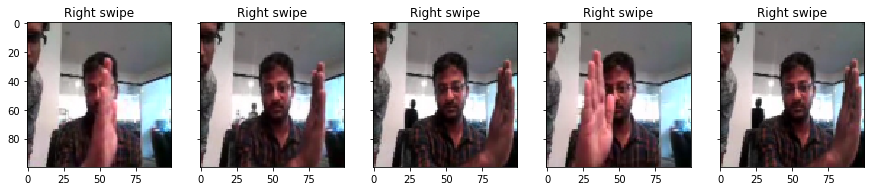

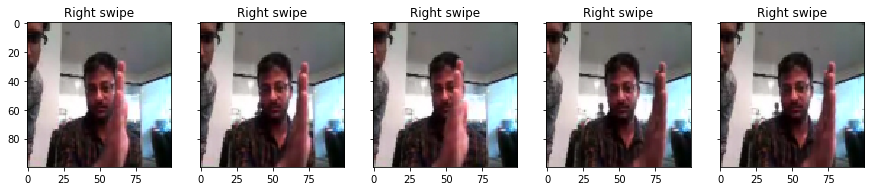

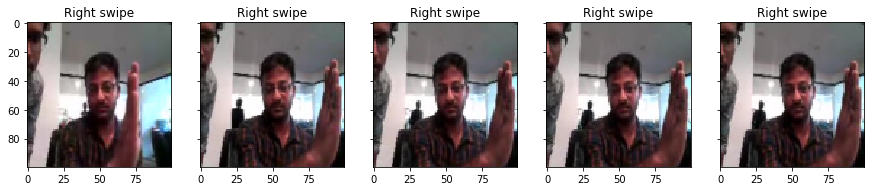

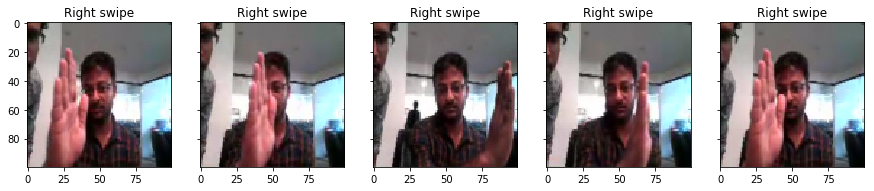

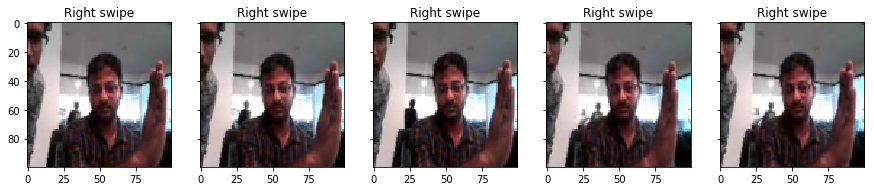

...

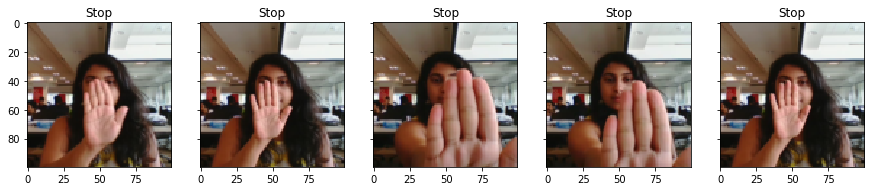

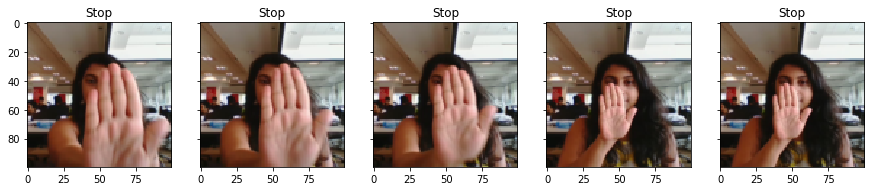

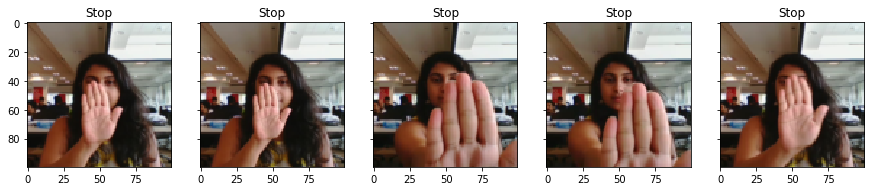

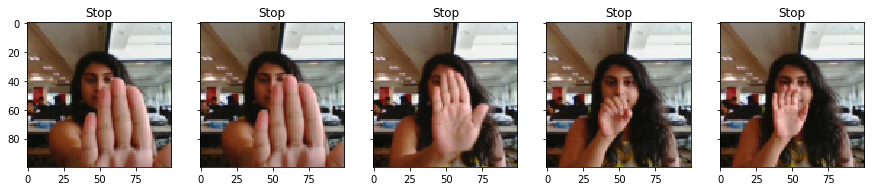

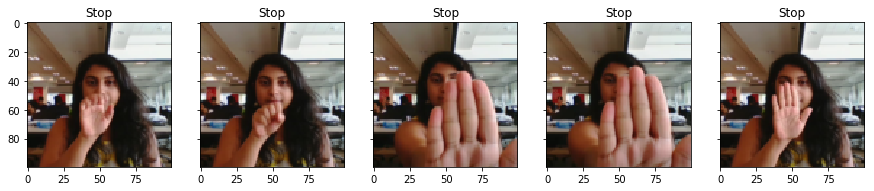

In [7]:
# Visualizing sample images to understand image file
for idx in range(0, len(batch_sample)):
    plot_montage_nframes(batch_sample[idx], captions=batch_label[idx],slices=5)

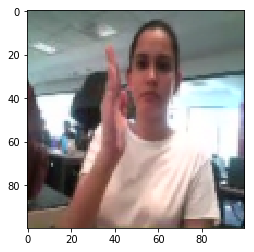

In [8]:
plt.imshow(batch_sample[4][28])

In [9]:
#Creating skin mask for images
def mask_skincolor(frame):
       
    lower = np.array([ 10,20, 20], dtype = "uint8")
    upper = np.array([ 200,120, 110], dtype = "uint8")
    
    mask = cv2.inRange(frame, lower, upper)
   
    output = cv2.bitwise_and(frame, frame, mask = mask)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (64, 64))
    skinMask = cv2.erode(mask, kernel, iterations = 2)
    skinMask = cv2.dilate(skinMask, kernel, iterations = 2)
    
    skinMask = cv2.GaussianBlur(mask, (3, 3), 0)
    edged = cv2.Canny(skinMask,10,100)
    image_skin = cv2.bitwise_and(frame, frame, mask = skinMask)
    edged = 255 - skinMask
    return edged,image_skin


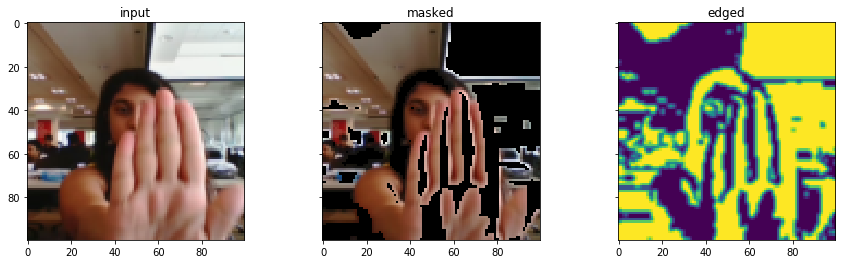

In [10]:
image = batch_sample[9,0]
edged,output = mask_skincolor(image)
plot_montage_nframes([image,output,edged],['input','masked','edged'],slices=3)

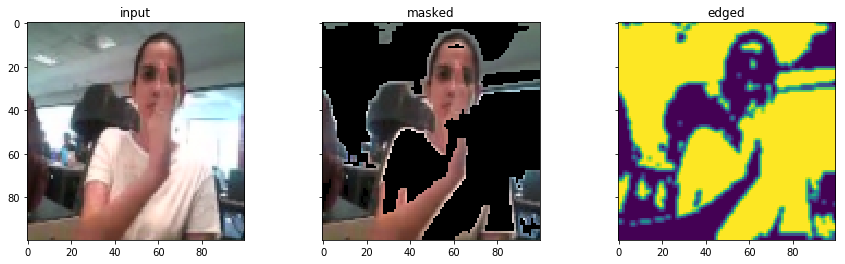

In [11]:
image = batch_sample[4,0]
edged,output = mask_skincolor(image)
plot_montage_nframes([image,output,edged],['input','masked','edged'],slices=3)

In [12]:
# The hand movement can be seen botton 3/4 frame setting ROI.
region_top = int( FRAME_HEIGHT / 4)
region_bottom = FRAME_HEIGHT
region_left = int(FRAME_WIDTH /5)
region_right = FRAME_WIDTH

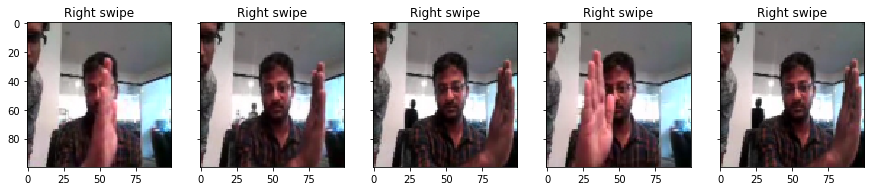

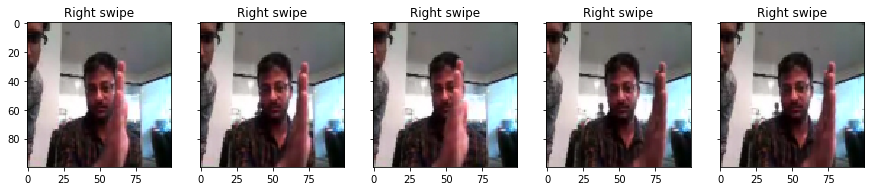

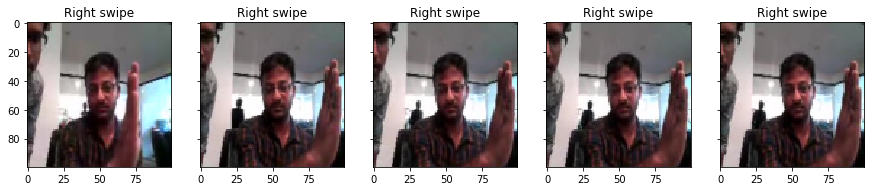

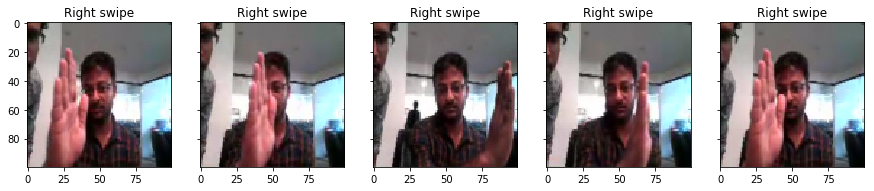

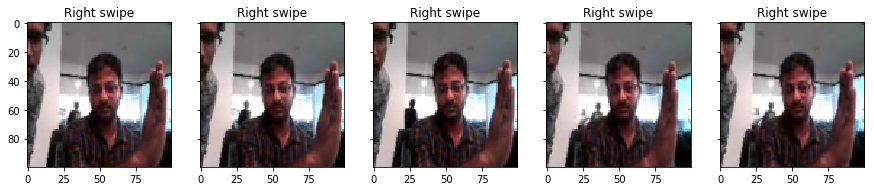

...

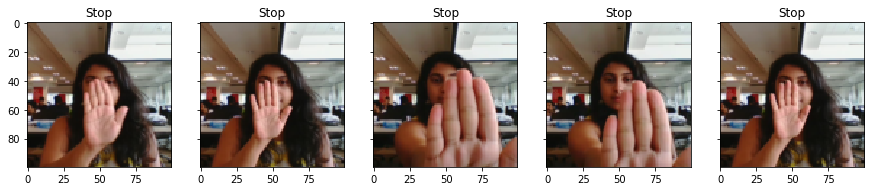

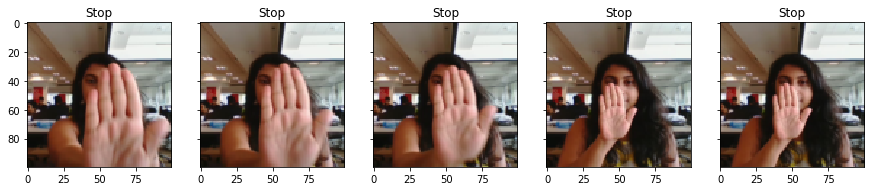

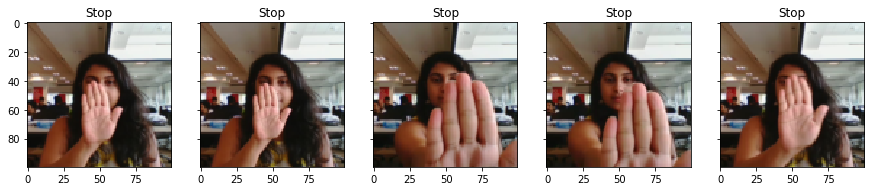

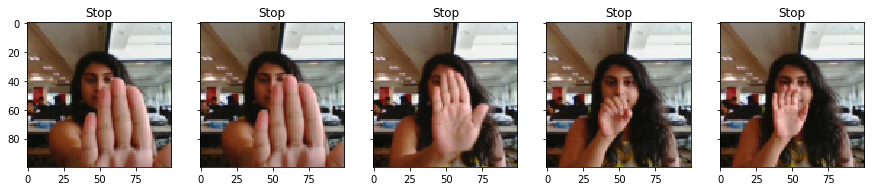

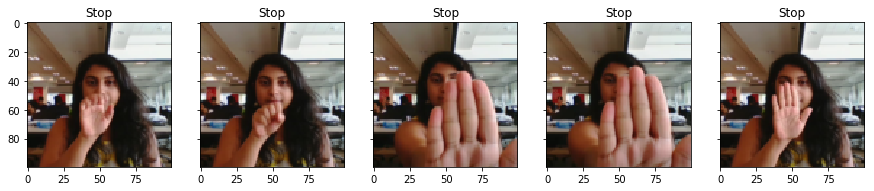

In [13]:
#Cropping the videos and removing noise from Image
batch_new = np.zeros((NO_VIDEOS,NO_FRAMES,FRAME_HEIGHT,FRAME_WIDTH,FRAME_CHANNELS)).astype(np.int64)
for folder in range(0,len(batch_sample)):    
    for idx in range(0,NO_FRAMES):
        
        frame =   batch_sample[folder,idx,region_top:region_bottom,region_left:region_right,:]
        image = imresize(frame,(FRAME_HEIGHT,FRAME_WIDTH))#,interpolation=cv2.INTER_AREA)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        # Using Gaussian blur to prevent frame noise from being labeled as an edge.
        image = cv2.GaussianBlur(image, (5,5), 0)
        batch_new[folder,idx,:,:,:]  = image
    # Checking cropped images blurred images
    plot_montage_nframes(batch_sample[folder], captions=batch_label[folder],slices=5)   

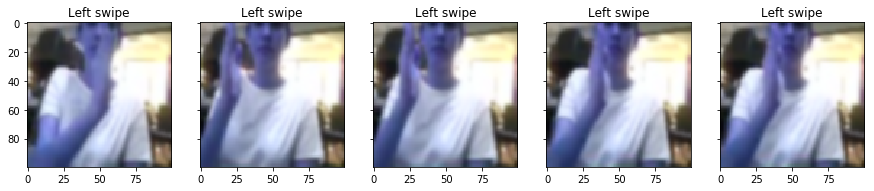

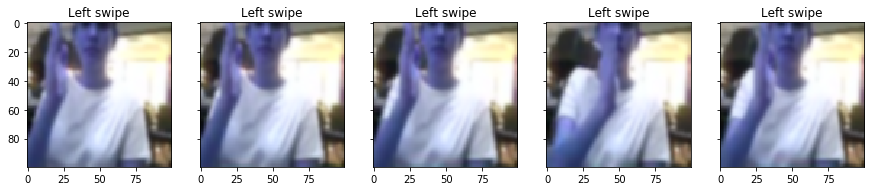

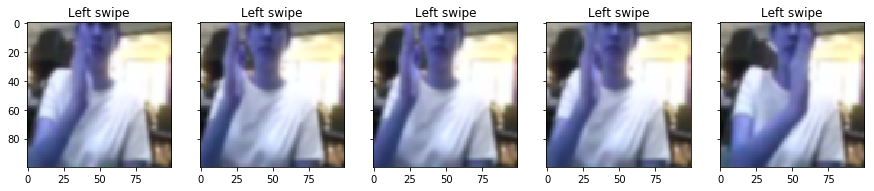

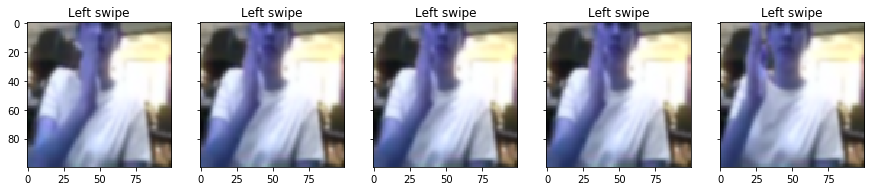

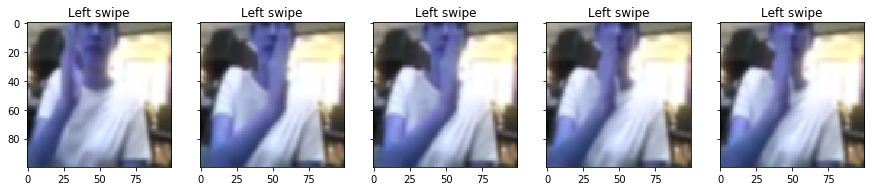

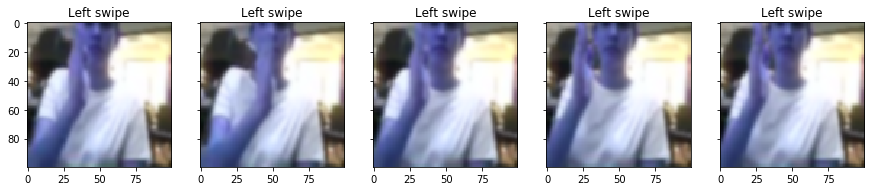

In [14]:
plot_montage_nframes(batch_new[4], captions=batch_label[4],slices=5)   

### Preprocessing images 
- We will crop image height by 16% from top, width 16% from left
- Using Gaussian blur to prevent frame noise from being labeled as an edge.
- Resize to hyperparamete size of image to get  consistent size of image as there image are two sizes 360*360, 160*120) height, widhth 
- Normalize the image to build model to avoid the possibility of exploding gradients

In [15]:
from skimage import transform as trf
from skimage import transform as trf
def pre_process(image):
    
# specify x and y coordinates to be used for shifting (mid points)
    height= image.shape[1]
    width = image.shape[0]
    cropped1=image[height//6:height,width//6:width,:]
    cropped = cropped1[:,:,0]
    shift_x, shift_y = image.shape[0]/2, image.shape[1]/2
# translation by certain units
    matrix_to_topleft = trf.SimilarityTransform(translation=[-shift_x, -shift_y])
    matrix_to_center = trf.SimilarityTransform(translation=[shift_x, shift_y])
    scale_transforms = trf.AffineTransform(scale=(0.8, 0.8))
    scale_matrix = matrix_to_topleft + scale_transforms + matrix_to_center
    scale_image_zoom_in = trf.warp(cropped, scale_matrix)
    return scale_image_zoom_in,cropped1

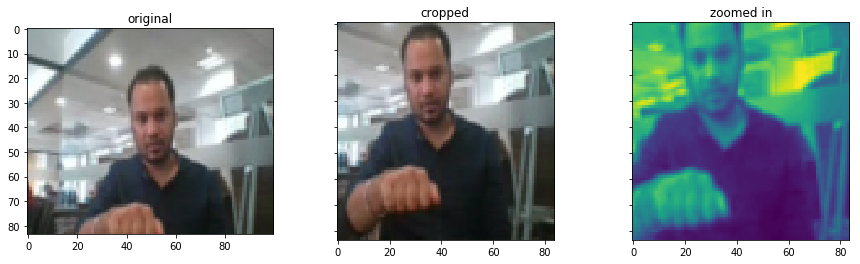

In [16]:
image = batch_sample[6,3]
zoom_in ,cropped= pre_process(image)
plot_montage_nframes([image,cropped, zoom_in],['original','cropped','zoomed in'],slices=3)

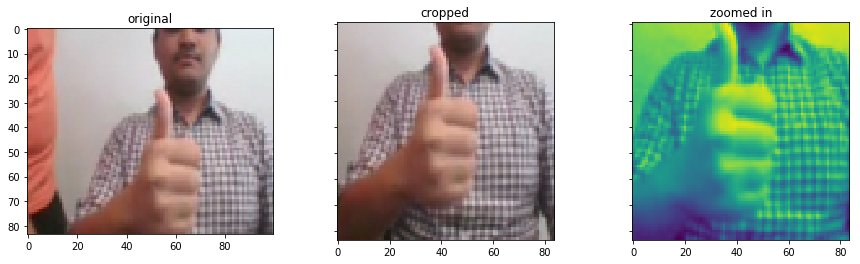

In [17]:
image = batch_sample[5,6]
zoom_in ,cropped= pre_process(image)
plot_montage_nframes([image,cropped, zoom_in],['original','cropped','zoomed in'],slices=3)

In [18]:
##from keras.models import Sequential, Model

import tensorflow.python.keras.engine

from tensorflow.python.keras.layers import Layer, InputSpec
from tensorflow.python.keras.layers import Dense, GRU, Flatten, TimeDistributed, Flatten, BatchNormalization, Activation

from tensorflow.python.keras.models import Sequential, Model


from tensorflow.python.keras.layers.convolutional import Conv3D, MaxPooling3D, Conv2D, MaxPooling2D
from tensorflow.python.keras.layers.recurrent import LSTM
from tensorflow.python.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from tensorflow.python.keras import optimizers
from tensorflow.python.keras.layers import Dropout



## Generator
This is one of the most important part of the code. The overall structure of the generator has been given. In the generator, you are going to preprocess the images as you have images of 2 different dimensions as well as create a batch of video frames. You have to experiment with `img_idx`, `y`,`z` and normalization such that you get high accuracy.

Note here that a video is represented above in the generator as (number of images, height, width, number of channels). Take this into consideration while creating the model architecture.

In [19]:
#trial run
class DataGenerator(metaclass= abc.ABCMeta):
    
    ## In this block, you read the folder names for training and validation. 
    ## You also set the `batch_size` here. Note that you set the batch size in such a way that you are able
    ## to use the GPU in full capacity. You keep increasing the batch size until the machine throws an error.
    
    def initialize_path(self,num_train_sequences,num_val_sequences):
        self.train_doc = np.random.permutation(open(project_Datafolder +  'train.csv').readlines())
        self.val_doc = np.random.permutation(open(project_Datafolder  + 'val.csv').readlines())
        self.train_path = project_Datafolder + 'train/'
        self.val_path =  project_Datafolder + 'val/'
        self.num_train_sequences = num_train_sequences
        self.num_val_sequences = num_val_sequences
  
    def initialize_image_properties(self,image_height = FRAME_HEIGHT,image_width=FRAME_WIDTH):
        self.image_height=image_height
        self.image_width=image_width
        self.channels=3
        self.num_classes=5
        self.total_frames=30
          
    def initialize_hyperparams(self,frames_to_sample=NO_FRAMES,batch_size=10,num_epochs=20):
        
        self.frames_to_sample=frames_to_sample
        self.batch_size=batch_size
        self.num_epochs=num_epochs
           
    
    def generator(self,project_Datafolder, folder_list, augment=False):
        img_idx = np.round(np.linspace(0,self.total_frames-1,self.frames_to_sample)).astype(int)

        batch_size=self.batch_size
        while True:
            t = np.random.permutation(folder_list)

            num_batches = len(t)//batch_size
        
            for batch in range(num_batches): 
                batch_data, batch_labels= self.batch_data(project_Datafolder,t,batch,batch_size,img_idx,augment)
                yield batch_data, batch_labels 

            remaining_seq=len(t)%batch_size
        
            if (remaining_seq != 0):
                batch_data, batch_labels= self.batch_data(project_Datafolder,t,num_batches,batch_size,img_idx,augment,remaining_seq)
                yield batch_data, batch_labels 
    
    
    def batch_data(self,project_Datafolder,t,batch,batch_size,img_idx,augment,remaining_seq=0):
    
        seq_len = remaining_seq if remaining_seq else batch_size
    
        batch_data = np.zeros((seq_len,len(img_idx),self.image_height,self.image_width,self.channels)) 
        batch_labels = np.zeros((seq_len,self.num_classes)) 
    
        if (augment):
            batch_data_aug = np.zeros((seq_len,len(img_idx),self.image_height,self.image_width,self.channels))

        for folder in range(seq_len): 
            imgs = os.listdir(project_Datafolder + t[folder + (batch*batch_size)].split(';')[0])

            for idx,item in enumerate(img_idx): 
                image = imread(project_Datafolder + t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                height= image.shape[1]
                width = image.shape[0]
                cropped1=image[height//6:height,width//6:width,:]
                image_resized=imresize(cropped1,(self.image_height,self.image_width,3))
            

                batch_data[folder,idx,:,:,0] = (image_resized[:,:,0])/255
                batch_data[folder,idx,:,:,1] = (image_resized[:,:,1])/255
                batch_data[folder,idx,:,:,2] = (image_resized[:,:,2])/255
            
                if (augment):
                    shifted = cv2.warpAffine(image, 
                                             np.float32([[1, 0, np.random.randint(-30,30)],[0, 1, np.random.randint(-30,30)]]), 
                                            (image.shape[1], image.shape[0]))
                    
                    gray = cv2.cvtColor(shifted,cv2.COLOR_BGR2GRAY)

                    x0, y0 = np.argwhere(gray > 0).min(axis=0)
                    x1, y1 = np.argwhere(gray > 0).max(axis=0) 
                    
                    cropped=shifted[x0:x1,y0:y1,:]
                    
                    image_resized=imresize(cropped,(self.image_height,self.image_width,3))
                                
                    batch_data_aug[folder,idx,:,:,0] = (image_resized[:,:,0])/255
                    batch_data_aug[folder,idx,:,:,1] = (image_resized[:,:,1])/255
                    batch_data_aug[folder,idx,:,:,2] = (image_resized[:,:,2])/255
                
            
            batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
            
    
        if (augment):
            batch_data=np.concatenate([batch_data,batch_data_aug])
            batch_labels=np.concatenate([batch_labels,batch_labels])

        
        return(batch_data,batch_labels)
    
    
    def train_model(self, model,mdl_name = 'Model_init', augment_data=False):
        train_folder_list = self.train_doc[:self.num_train_sequences]
        val_folder_list = self.val_doc[:self.num_val_sequences]
        train_generator = self.generator(self.train_path, self.train_doc,augment=augment_data)
        val_generator = self.generator(self.val_path, self.val_doc)
       #self.plot_image(self,train_generator)
        model_name = mdl_name + '_' + str(datetime.datetime.now()).replace(' ','').replace(':','_') + '/'
    
        if not os.path.exists(model_name):
            os.mkdir(model_name)
        
        filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'

        #num_train_sequences = self.num_train_sequences
        print('# Number of training sequences = ', self.num_train_sequences)
       # num_val_sequences = len(self.val_doc)
        print('# Number of validation sequences = ', self.num_val_sequences)
        print('# image_height = ', self.image_height)    
        print('# image_width = ', self.image_width)    
        print('# batch size = ', self.batch_size)    
        print('# epochs = ', self.num_epochs)
        print('# frames_to_sample = ', self.frames_to_sample)
        print("\n")
        
        
        checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=False, mode='auto', period=1)
        LR = ReduceLROnPlateau(monitor='val_loss', factor=0.2, verbose=1, patience=4)
        callbacks_list = [checkpoint, LR]

        if (self.num_train_sequences%self.batch_size) == 0:
            steps_per_epoch = self.num_train_sequences//self.batch_size
        else:
            steps_per_epoch = (self.num_train_sequences//self.batch_size) + 1

        if (self.num_val_sequences%self.batch_size) == 0:
            validation_steps = self.num_val_sequences//self.batch_size
        else:
            validation_steps = (self.num_val_sequences//self.batch_size) + 1
    
        ##history=model.fit_generator(train_generator, steps_per_epoch=steps_per_epoch, epochs=self.num_epochs, verbose=1, 
        history=model.fit_generator(train_generator, steps_per_epoch=steps_per_epoch, epochs=self.num_epochs, verbose=1, 
                            callbacks=callbacks_list, validation_data=val_generator, 
                            validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)
        return history

    
        

In [20]:
class RNNCNNFINAL(DataGenerator):
    
    def define_model(self,lstm_cells=64,dense_neurons=64,dropout=0.25):

        model = Sequential()

        model.add(TimeDistributed(Conv2D(16, (3, 3) , padding='same', activation='relu'),
                                  input_shape=(self.frames_to_sample,self.image_height,self.image_width,self.channels)))
        model.add(TimeDistributed(BatchNormalization()))
        model.add(TimeDistributed(MaxPooling2D((2, 2))))
        
        model.add(TimeDistributed(Conv2D(32, (3, 3) , padding='same', activation='relu')))
        model.add(TimeDistributed(BatchNormalization()))
        model.add(TimeDistributed(MaxPooling2D((2, 2))))
        
        model.add(TimeDistributed(Conv2D(64, (3, 3) , padding='same', activation='relu')))
        model.add(TimeDistributed(BatchNormalization()))
        model.add(TimeDistributed(MaxPooling2D((2, 2))))
        
        model.add(TimeDistributed(Conv2D(128, (3, 3) , padding='same', activation='relu')))
        model.add(TimeDistributed(BatchNormalization()))
        model.add(TimeDistributed(MaxPooling2D((2, 2))))
        
        model.add(TimeDistributed(Conv2D(256, (3, 3) , padding='same', activation='relu')))
        model.add(TimeDistributed(BatchNormalization()))
        model.add(TimeDistributed(MaxPooling2D((2, 2))))
        
        #model.add(TimeDistributed(Conv2D(512, (2, 2) , padding='valid', activation='relu')))
       # model.add(TimeDistributed(BatchNormalization()))
       # model.add(TimeDistributed(MaxPooling2D((2, 2))))

        model.add(TimeDistributed(Flatten()))


        model.add(LSTM(lstm_cells))
        model.add(Dropout(dropout))
        
        model.add(Dense(dense_neurons,activation='relu'))
        model.add(Dropout(dropout))
        
        model.add(Dense(self.num_classes, activation='softmax'))
        optimiser = optimizers.Adam()
        model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
        return model

In [21]:
lstm_cnn2d = RNNCNNFINAL()
lstm_cnn2d.initialize_path(len(TRAIN_DOC_CSV),len(VAL_DOC_CSV))
lstm_cnn2d.initialize_image_properties(image_height=120,image_width=120)
lstm_cnn2d.initialize_hyperparams(frames_to_sample=18,batch_size=10,num_epochs=20)
lstm_cnn2d_final=lstm_cnn2d.define_model(lstm_cells=128,dense_neurons=128,dropout=0.25)
lstm_cnn2d_final.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed (TimeDistri (None, 18, 120, 120, 16)  448       
_________________________________________________________________
time_distributed_1 (TimeDist (None, 18, 120, 120, 16)  64        
_________________________________________________________________
time_distributed_2 (TimeDist (None, 18, 60, 60, 16)    0         
_________________________________________________________________
time_distributed_3 (TimeDist (None, 18, 60, 60, 32)    4640      
_________________________________________________________________
time_distributed_4 (TimeDist (None, 18, 60, 60, 32)    128       
_________________________________________________________________
time_distributed_5 (TimeDist (None, 18, 30, 30, 32)    0         
_________________________________________________________________
time_distributed_6 (TimeDist (None, 18, 30, 30, 64)    18496     
__________

In [24]:
print("Total Params:", lstm_cnn2d_final.count_params())

history_model_Final=lstm_cnn2d.train_model(lstm_cnn2d_final,mdl_name='Model_2dCNN_LSTM',augment_data=True)

Total Params: 1657445
# Number of training sequences =  663
# Number of validation sequences =  100
# image_height =  120
# image_width =  120
# batch size =  10
# epochs =  20
# frames_to_sample =  18


Epoch 1/20
66/67 [============================>.] - ETA: 2s - loss: 1.3846 - categorical_accuracy: 0.3902
Epoch 00001: saving model to Model_2dCNN_LSTM_2020-11-0214_41_33.555458/model-00001-1.38883-0.38914-2.40365-0.23000.h5
67/67 [==============================] - 197s 3s/step - loss: 1.3983 - categorical_accuracy: 0.3869 - val_loss: 2.4037 - val_categorical_accuracy: 0.2300
Epoch 2/20
66/67 [============================>.] - ETA: 1s - loss: 1.2454 - categorical_accuracy: 0.4652
Epoch 00002: saving model to Model_2dCNN_LSTM_2020-11-0214_41_33.555458/model-00002-1.24500-0.46606-2.08678-0.15000.h5
67/67 [==============================] - 91s 1s/step - loss: 1.2440 - categorical_accuracy: 0.4681 - val_loss: 2.0868 - val_categorical_accuracy: 0.1500
Epoch 3/20
66/67 [=====================

In [25]:
def plotImage(history):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,4))
    axes[0].plot(history.history['loss'])   
    axes[0].plot(history.history['val_loss'])
    axes[0].legend(['loss','val_loss'])

    axes[1].plot(history.history['categorical_accuracy'])   
    axes[1].plot(history.history['val_categorical_accuracy'])
    axes[1].legend(['categorical_accuracy','val_categorical_accuracy'])

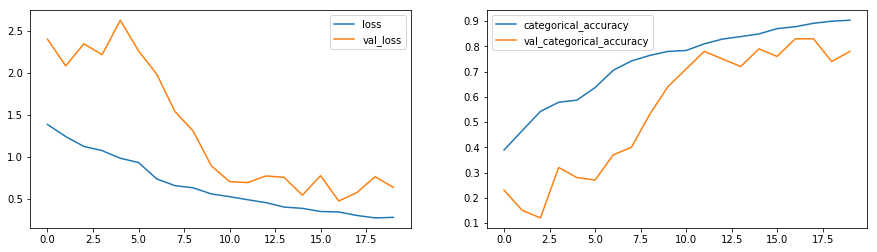

In [26]:
plotImage(history_model_Final)

# WORKING OF ALL TRIAL MODELS 

## Plotting:

In [15]:
#trial run
class DataGenerator(metaclass= abc.ABCMeta):
    
    ## In this block, you read the folder names for training and validation. 
    ## You also set the `batch_size` here. Note that you set the batch size in such a way that you are able
    ## to use the GPU in full capacity. You keep increasing the batch size until the machine throws an error.
    
    def initialize_path(self,num_train_sequences,num_val_sequences):
        self.train_doc = np.random.permutation(open(project_Datafolder +  'train.csv').readlines())
        self.val_doc = np.random.permutation(open(project_Datafolder  + 'val.csv').readlines())
        self.train_path = project_Datafolder + 'train/'
        self.val_path =  project_Datafolder + 'val/'
        self.num_train_sequences = num_train_sequences
        self.num_val_sequences = num_val_sequences
  
    def initialize_image_properties(self,image_height = FRAME_HEIGHT,image_width=FRAME_WIDTH):
        self.image_height=image_height
        self.image_width=image_width
        self.channels=3
        self.num_classes=5
        self.total_frames=30
          
    def initialize_hyperparams(self,frames_to_sample=NO_FRAMES,batch_size=10,num_epochs=20):
        
        self.frames_to_sample=frames_to_sample
        self.batch_size=batch_size
        self.num_epochs=num_epochs
           
    
    def generator(self,project_Datafolder, folder_list, augment=False):
        img_idx = np.round(np.linspace(0,self.total_frames-1,self.frames_to_sample)).astype(int)

        batch_size=self.batch_size
        while True:
            t = np.random.permutation(folder_list)

            num_batches = len(t)//batch_size
        
            for batch in range(num_batches): 
                batch_data, batch_labels= self.batch_data(project_Datafolder,t,batch,batch_size,img_idx,augment)
                yield batch_data, batch_labels 

            remaining_seq=len(t)%batch_size
        
            if (remaining_seq != 0):
                batch_data, batch_labels= self.batch_data(project_Datafolder,t,num_batches,batch_size,img_idx,augment,remaining_seq)
                yield batch_data, batch_labels 
    
    
    def batch_data(self,project_Datafolder,t,batch,batch_size,img_idx,augment,remaining_seq=0):
    
        seq_len = remaining_seq if remaining_seq else batch_size
    
        batch_data = np.zeros((seq_len,len(img_idx),self.image_height,self.image_width,self.channels)) 
        batch_labels = np.zeros((seq_len,self.num_classes)) 
    
        if (augment):
            batch_data_aug = np.zeros((seq_len,len(img_idx),self.image_height,self.image_width,self.channels))

        for folder in range(seq_len): 
            imgs = os.listdir(project_Datafolder + t[folder + (batch*batch_size)].split(';')[0])

            for idx,item in enumerate(img_idx): 
                image = imread(project_Datafolder + t[folder + (batch*batch_size)].strip().split(';')[0]+'/'+imgs[item]).astype(np.float32)
                image_resized=imresize(image,(self.image_height,self.image_width,3))
            

                batch_data[folder,idx,:,:,0] = (image_resized[:,:,0])/255
                batch_data[folder,idx,:,:,1] = (image_resized[:,:,1])/255
                batch_data[folder,idx,:,:,2] = (image_resized[:,:,2])/255
            
                if (augment):
                    shifted = cv2.warpAffine(image, 
                                             np.float32([[1, 0, np.random.randint(-30,30)],[0, 1, np.random.randint(-30,30)]]), 
                                            (image.shape[1], image.shape[0]))
                    
                    gray = cv2.cvtColor(shifted,cv2.COLOR_BGR2GRAY)

                    x0, y0 = np.argwhere(gray > 0).min(axis=0)
                    x1, y1 = np.argwhere(gray > 0).max(axis=0) 
                    
                    cropped=shifted[x0:x1,y0:y1,:]
                    
                    image_resized=imresize(cropped,(self.image_height,self.image_width,3))
                                
                    batch_data_aug[folder,idx,:,:,0] = (image_resized[:,:,0])/255
                    batch_data_aug[folder,idx,:,:,1] = (image_resized[:,:,1])/255
                    batch_data_aug[folder,idx,:,:,2] = (image_resized[:,:,2])/255
                
            
            batch_labels[folder, int(t[folder + (batch*batch_size)].strip().split(';')[2])] = 1
            
    
        if (augment):
            batch_data=np.concatenate([batch_data,batch_data_aug])
            batch_labels=np.concatenate([batch_labels,batch_labels])

        
        return(batch_data,batch_labels)
    
    
    def train_model(self, model,mdl_name = 'Model_init', augment_data=False):
        train_folder_list = self.train_doc[:self.num_train_sequences]
        val_folder_list = self.val_doc[:self.num_val_sequences]
        train_generator = self.generator(self.train_path, self.train_doc,augment=augment_data)
        val_generator = self.generator(self.val_path, self.val_doc)
       #self.plot_image(self,train_generator)
        model_name = mdl_name + '_' + str(datetime.datetime.now()).replace(' ','').replace(':','_') + '/'
    
        if not os.path.exists(model_name):
            os.mkdir(model_name)
        
        filepath = model_name + 'model-{epoch:05d}-{loss:.5f}-{categorical_accuracy:.5f}-{val_loss:.5f}-{val_categorical_accuracy:.5f}.h5'

        #num_train_sequences = self.num_train_sequences
        print('# Number of training sequences = ', self.num_train_sequences)
       # num_val_sequences = len(self.val_doc)
        print('# Number of validation sequences = ', self.num_val_sequences)
        print('# image_height = ', self.image_height)    
        print('# image_width = ', self.image_width)    
        print('# batch size = ', self.batch_size)    
        print('# epochs = ', self.num_epochs)
        print('# frames_to_sample = ', self.frames_to_sample)
        print("\n")
        
        
        checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=False, save_weights_only=False, mode='auto', period=1)
        LR = ReduceLROnPlateau(monitor='val_loss', factor=0.2, verbose=1, patience=4)
        callbacks_list = [checkpoint, LR]

        if (self.num_train_sequences%self.batch_size) == 0:
            steps_per_epoch = self.num_train_sequences//self.batch_size
        else:
            steps_per_epoch = (self.num_train_sequences//self.batch_size) + 1

        if (self.num_val_sequences%self.batch_size) == 0:
            validation_steps = self.num_val_sequences//self.batch_size
        else:
            validation_steps = (self.num_val_sequences//self.batch_size) + 1
    
        ##history=model.fit_generator(train_generator, steps_per_epoch=steps_per_epoch, epochs=self.num_epochs, verbose=1, 
        history=model.fit_generator(train_generator, steps_per_epoch=steps_per_epoch, epochs=self.num_epochs, verbose=1, 
                            callbacks=callbacks_list, validation_data=val_generator, 
                            validation_steps=validation_steps, class_weight=None, workers=1, initial_epoch=0)
        return history

    
        

## Model Class:

In [21]:
class BuildModel(DataGenerator):
    
    ## Sample model
    def define_model(self):

        model = Sequential()
        model.add(Conv3D(16, (3, 3, 3), padding='same',
                 input_shape=(self.frames_to_sample,self.image_height,self.image_width,self.channels)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling3D(pool_size=(2, 2, 2)))

        model.add(Conv3D(32, (2, 2, 2), padding='same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling3D(pool_size=(2, 2, 2)))

        model.add(Conv3D(64, (2, 2, 2), padding='same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling3D(pool_size=(2, 2, 2)))

        model.add(Conv3D(128, (2, 2, 2), padding='same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling3D(pool_size=(2, 2, 2)))

        model.add(Flatten())
        model.add(Dense(128,activation='relu'))
        model.add(BatchNormalization())#,dropout=.25)
        #model.add(Dropout(0.5))

        model.add(Dense(64,activation='relu'))
        model.add(BatchNormalization())#,dropout=.25)
        #model.add(Dropout(0.25))

        model.add(Dense(self.num_classes,activation='softmax'))

        optimiser = optimizers.Adam()

        model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
        return model
    
     ## Model 1 - Base Model - No Data Augmentation Batch Size 40 and Epoch 15
    def model1(self,filtersize=(3,3,3),dense_neurons=64,dropout=0.25):

        model = Sequential()
        model.add(Conv3D(16, filtersize, padding='same',
                 input_shape=(self.frames_to_sample,self.image_height,self.image_width,self.channels)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling3D(pool_size=(2, 2, 2)))

        model.add(Conv3D(32, filtersize, padding='same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling3D(pool_size=(2, 2, 2)))

        model.add(Conv3D(64, filtersize, padding='same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling3D(pool_size=(2, 2, 2)))

        model.add(Conv3D(128, filtersize, padding='same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling3D(pool_size=(2, 2, 2)))

        model.add(Flatten())
        model.add(Dense(dense_neurons,activation='relu'))
        model.add(BatchNormalization())
        model.add(Dropout(dropout))

        model.add(Dense(dense_neurons,activation='relu'))
        model.add(BatchNormalization())
        model.add(Dropout(dropout))


        model.add(Dense(self.num_classes,activation='softmax'))

        optimiser = optimizers.Adam()
        model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
        return model
    
    

In [22]:
#conv_3d=BuildModel()
#conv_3d.initialize_path(10,10)
#conv_3d.initialize_image_properties(image_height=160,image_width=160)
#conv_3d.initialize_hyperparams(frames_to_sample=16,batch_size=30,num_epochs=3)
#conv_3d_model=conv_3d.define_model()

#print("Total Params: ", conv_3d_model.count_params())

#conv_3d.train_model(conv_3d_model)

For below details:

Total Params:  1736389
- Number of training sequences =  663
- Number of validation sequences =  100
- image_height =  160
- image_width =  160
- batch size =  30
- epochs =  3
- frames_to_sample =  30


Getting: ResourceExhaustedError: OOM when allocating tensor with shape[30,30,160,160,16] and type float on /job:localhost/replica:0/task:0/device:CPU:0 by allocator cpu


##### Experimenting to check how training time is affected by image resolution, number of images in sequence and batch size

In [22]:
# Intializing model 10 video sequences
conv_3d=BuildModel()
conv_3d.initialize_path(10,10)

conv_3d.initialize_image_properties(image_height=160,image_width=160)
conv_3d.initialize_hyperparams(frames_to_sample=30,batch_size=10,num_epochs=1)

conv_3d_model1=conv_3d.define_model()
conv_3d_model1.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv3d (Conv3D)              (None, 30, 160, 160, 16)  1312      
_________________________________________________________________
activation (Activation)      (None, 30, 160, 160, 16)  0         
_________________________________________________________________
batch_normalization_8 (Batch (None, 30, 160, 160, 16)  64        
_________________________________________________________________
max_pooling3d (MaxPooling3D) (None, 15, 80, 80, 16)    0         
_________________________________________________________________
conv3d_1 (Conv3D)            (None, 15, 80, 80, 32)    4128      
_________________________________________________________________
activation_1 (Activation)    (None, 15, 80, 80, 32)    0         
_________________________________________________________________
batch_normalization_9 (Batch (None, 15, 80, 80, 32)    128       
__________

In [27]:
conv_3d.train_model(conv_3d_model1)

# Number of training sequences =  10
# Number of validation sequences =  10
# image_height =  160
# image_width =  160
# batch size =  10
# epochs =  1
# frames_to_sample =  30


Epoch 1/1

Epoch 00001: saving model to Model_init_2020-11-0212_42_44.794598/model-00001-3.15608-0.10000-1.59421-0.30000.h5
1/1 [==============================] - 10s 10s/step - loss: 3.1561 - categorical_accuracy: 0.1000 - val_loss: 1.5942 - val_categorical_accuracy: 0.3000


In [28]:
conv_3d=BuildModel()
conv_3d.initialize_path(10,10)
conv_3d.initialize_image_properties(image_height=100,image_width=100)
conv_3d.initialize_hyperparams(frames_to_sample=30,batch_size=10,num_epochs=2)
conv_3d_model=conv_3d.define_model()

print("Total Params:", conv_3d_model.count_params())

conv_3d.train_model(conv_3d_model)

Total Params: 687813
# Number of training sequences =  10
# Number of validation sequences =  10
# image_height =  100
# image_width =  100
# batch size =  10
# epochs =  2
# frames_to_sample =  30


Epoch 1/2

Epoch 00001: saving model to Model_init_2020-11-0212_43_17.387025/model-00001-2.81563-0.10000-1.60032-0.30000.h5
1/1 [==============================] - 14s 14s/step - loss: 2.8156 - categorical_accuracy: 0.1000 - val_loss: 1.6003 - val_categorical_accuracy: 0.3000
Epoch 2/2

Epoch 00002: saving model to Model_init_2020-11-0212_43_17.387025/model-00002-2.16493-0.20000-1.61136-0.20000.h5
1/1 [==============================] - 6s 6s/step - loss: 2.1649 - categorical_accuracy: 0.2000 - val_loss: 1.6114 - val_categorical_accuracy: 0.2000


In [29]:
conv_3d=BuildModel()
conv_3d.initialize_path(10,10)
conv_3d.initialize_image_properties(image_height=100,image_width=100)
conv_3d.initialize_hyperparams(frames_to_sample=16,batch_size=3,num_epochs=2)
conv_3d_model=conv_3d.define_model()

print("Total Params:", conv_3d_model.count_params())

conv_3d.train_model(conv_3d_model)

Total Params: 687813
# Number of training sequences =  10
# Number of validation sequences =  10
# image_height =  100
# image_width =  100
# batch size =  3
# epochs =  2
# frames_to_sample =  16


Epoch 1/2
3/4 [=====================>........] - ETA: 2s - loss: 2.2163 - categorical_accuracy: 0.3333   
Epoch 00001: saving model to Model_init_2020-11-0212_43_39.184487/model-00001-2.09096-0.33333-1.56805-0.33333.h5
4/4 [==============================] - 10s 2s/step - loss: 2.0910 - categorical_accuracy: 0.3333 - val_loss: 1.5681 - val_categorical_accuracy: 0.3333
Epoch 2/2
3/4 [=====================>........] - ETA: 0s - loss: 2.6874 - categorical_accuracy: 0.1111  
Epoch 00002: saving model to Model_init_2020-11-0212_43_39.184487/model-00002-2.47696-0.16667-1.66787-0.25000.h5
4/4 [==============================] - 2s 466ms/step - loss: 2.4770 - categorical_accuracy: 0.1667 - val_loss: 1.6679 - val_categorical_accuracy: 0.2500


In [30]:
##conv_3d=BuildModel()
##conv_3d.initialize_path(project_Datafolder)
##conv_3d.initialize_image_properties(image_height=160,image_width=160)
##conv_3d.initialize_hyperparams(frames_to_sample=45,batch_size=45,num_epochs=2)
##conv_3d_model=conv_3d.define_model()

##print("Total Params:", conv_3d_model.count_params())

##conv_3d.train_model(conv_3d_model)



In [31]:
conv_3d=BuildModel()
conv_3d.initialize_path(10,10)
conv_3d.initialize_image_properties(image_height=160,image_width=160)
conv_3d.initialize_hyperparams(frames_to_sample=16,batch_size=5,num_epochs=2)
conv_3d_model=conv_3d.define_model()

print("Total Params:", conv_3d_model.count_params())

conv_3d.train_model(conv_3d_model)

Total Params: 1736389
# Number of training sequences =  10
# Number of validation sequences =  10
# image_height =  160
# image_width =  160
# batch size =  5
# epochs =  2
# frames_to_sample =  16


Epoch 1/2
1/2 [==============>...............] - ETA: 7s - loss: 2.1681 - categorical_accuracy: 0.0000e+00
Epoch 00001: saving model to Model_init_2020-11-0212_43_51.303567/model-00001-1.97492-0.10000-1.71015-0.00000.h5
2/2 [==============================] - 11s 6s/step - loss: 1.9749 - categorical_accuracy: 0.1000 - val_loss: 1.7101 - val_categorical_accuracy: 0.0000e+00
Epoch 2/2
1/2 [==============>...............] - ETA: 0s - loss: 2.3756 - categorical_accuracy: 0.4000
Epoch 00002: saving model to Model_init_2020-11-0212_43_51.303567/model-00002-2.27218-0.30000-1.62438-0.20000.h5
2/2 [==============================] - 3s 1s/step - loss: 2.2722 - categorical_accuracy: 0.3000 - val_loss: 1.6244 - val_categorical_accuracy: 0.2000


In [32]:
conv_3d=BuildModel()
conv_3d.initialize_path(10,10)
conv_3d.initialize_image_properties(image_height=100,image_width=100)
conv_3d.initialize_hyperparams(frames_to_sample=16,batch_size=10,num_epochs=2)
conv_3d_model=conv_3d.define_model()

print("Total Params:", conv_3d_model.count_params())

conv_3d.train_model(conv_3d_model)

Total Params: 687813
# Number of training sequences =  10
# Number of validation sequences =  10
# image_height =  100
# image_width =  100
# batch size =  10
# epochs =  2
# frames_to_sample =  16


Epoch 1/2

Epoch 00001: saving model to Model_init_2020-11-0212_44_06.003719/model-00001-2.58097-0.20000-1.60264-0.20000.h5
1/1 [==============================] - 12s 12s/step - loss: 2.5810 - categorical_accuracy: 0.2000 - val_loss: 1.6026 - val_categorical_accuracy: 0.2000
Epoch 2/2

Epoch 00002: saving model to Model_init_2020-11-0212_44_06.003719/model-00002-2.31126-0.30000-1.59790-0.10000.h5
1/1 [==============================] - 1s 1s/step - loss: 2.3113 - categorical_accuracy: 0.3000 - val_loss: 1.5979 - val_categorical_accuracy: 0.1000


In [33]:
conv_3d=BuildModel()
conv_3d.initialize_path(10,10)
conv_3d.initialize_image_properties(image_height=100,image_width=100)
conv_3d.initialize_hyperparams(frames_to_sample=30,batch_size=10,num_epochs=2)
conv_3d_model=conv_3d.define_model()

print("Total Params:", conv_3d_model.count_params())

conv_3d.train_model(conv_3d_model)

Total Params: 687813
# Number of training sequences =  10
# Number of validation sequences =  10
# image_height =  100
# image_width =  100
# batch size =  10
# epochs =  2
# frames_to_sample =  30


Epoch 1/2

Epoch 00001: saving model to Model_init_2020-11-0212_44_21.121784/model-00001-1.87703-0.30000-1.58432-0.20000.h5
1/1 [==============================] - 14s 14s/step - loss: 1.8770 - categorical_accuracy: 0.3000 - val_loss: 1.5843 - val_categorical_accuracy: 0.2000
Epoch 2/2

Epoch 00002: saving model to Model_init_2020-11-0212_44_21.121784/model-00002-2.50751-0.20000-1.60389-0.10000.h5
1/1 [==============================] - 5s 5s/step - loss: 2.5075 - categorical_accuracy: 0.2000 - val_loss: 1.6039 - val_categorical_accuracy: 0.1000


In [34]:
conv_3d=BuildModel()
conv_3d.initialize_path(10,10)
conv_3d.initialize_image_properties(image_height=160,image_width=160)
conv_3d.initialize_hyperparams(frames_to_sample=30,batch_size=5,num_epochs=2)
conv_3d_model=conv_3d.define_model()

print("Total Params:", conv_3d_model.count_params())

conv_3d.train_model(conv_3d_model)

Total Params: 1736389
# Number of training sequences =  10
# Number of validation sequences =  10
# image_height =  160
# image_width =  160
# batch size =  5
# epochs =  2
# frames_to_sample =  30


Epoch 1/2
1/2 [==============>...............] - ETA: 8s - loss: 1.5343 - categorical_accuracy: 0.0000e+00
Epoch 00001: saving model to Model_init_2020-11-0212_44_41.877092/model-00001-1.78902-0.10000-1.58133-0.40000.h5
2/2 [==============================] - 14s 7s/step - loss: 1.7890 - categorical_accuracy: 0.1000 - val_loss: 1.5813 - val_categorical_accuracy: 0.4000
Epoch 2/2
1/2 [==============>...............] - ETA: 0s - loss: 2.4558 - categorical_accuracy: 0.0000e+00
Epoch 00002: saving model to Model_init_2020-11-0212_44_41.877092/model-00002-1.95039-0.20000-1.56534-0.40000.h5
2/2 [==============================] - 3s 1s/step - loss: 1.9504 - categorical_accuracy: 0.2000 - val_loss: 1.5653 - val_categorical_accuracy: 0.4000


In [35]:
conv_3d=BuildModel()
conv_3d.initialize_path(10,10)
conv_3d.initialize_image_properties(image_height=160,image_width=160)
conv_3d.initialize_hyperparams(frames_to_sample=16,batch_size=10,num_epochs=2)
conv_3d_model=conv_3d.define_model()

print("Total Params:", conv_3d_model.count_params())

conv_3d.train_model(conv_3d_model)

Total Params: 1736389
# Number of training sequences =  10
# Number of validation sequences =  10
# image_height =  160
# image_width =  160
# batch size =  10
# epochs =  2
# frames_to_sample =  16


Epoch 1/2

Epoch 00001: saving model to Model_init_2020-11-0212_44_59.988016/model-00001-1.83962-0.40000-1.61067-0.10000.h5
1/1 [==============================] - 14s 14s/step - loss: 1.8396 - categorical_accuracy: 0.4000 - val_loss: 1.6107 - val_categorical_accuracy: 0.1000
Epoch 2/2

Epoch 00002: saving model to Model_init_2020-11-0212_44_59.988016/model-00002-1.63907-0.20000-1.63509-0.10000.h5
1/1 [==============================] - 2s 2s/step - loss: 1.6391 - categorical_accuracy: 0.2000 - val_loss: 1.6351 - val_categorical_accuracy: 0.1000


In [36]:
conv_3d=BuildModel()
conv_3d.initialize_path(10,10)
conv_3d.initialize_image_properties(image_height=160,image_width=160)
conv_3d.initialize_hyperparams(frames_to_sample=16,batch_size=10,num_epochs=2)
conv_3d_model=conv_3d.define_model()

print("Total Params:", conv_3d_model.count_params())

conv_3d.train_model(conv_3d_model)

Total Params: 1736389
# Number of training sequences =  10
# Number of validation sequences =  10
# image_height =  160
# image_width =  160
# batch size =  10
# epochs =  2
# frames_to_sample =  16


Epoch 1/2

Epoch 00001: saving model to Model_init_2020-11-0212_45_18.042399/model-00001-2.05417-0.10000-1.60923-0.10000.h5
1/1 [==============================] - 13s 13s/step - loss: 2.0542 - categorical_accuracy: 0.1000 - val_loss: 1.6092 - val_categorical_accuracy: 0.1000
Epoch 2/2

Epoch 00002: saving model to Model_init_2020-11-0212_45_18.042399/model-00002-2.15499-0.10000-1.59451-0.30000.h5
1/1 [==============================] - 2s 2s/step - loss: 2.1550 - categorical_accuracy: 0.1000 - val_loss: 1.5945 - val_categorical_accuracy: 0.3000


##### From the above experiments we can say that 'image resolution' and 'number of frames' in sequence have more impact on training time than 'batch size'.

# Model 1 - Reduce filter size to (2,2,2) and image res to 120 x  120

In [37]:
class ModelConv3D1(DataGenerator):
    
    def define_model(self,filtersize=(3,3,3),dense_neurons=64,dropout=0.25):

        model = Sequential()
        model.add(Conv3D(16, filtersize, padding='same',
                 input_shape=(self.frames_to_sample,self.image_height,self.image_width,self.channels)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling3D(pool_size=(2, 2, 2)))

        model.add(Conv3D(32, filtersize, padding='same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling3D(pool_size=(2, 2, 2)))

        model.add(Conv3D(64, filtersize, padding='same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling3D(pool_size=(2, 2, 2)))

        model.add(Conv3D(128, filtersize, padding='same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling3D(pool_size=(2, 2, 2)))

        model.add(Flatten())
        model.add(Dense(dense_neurons,activation='relu'))
        model.add(BatchNormalization())
        model.add(Dropout(dropout))

        model.add(Dense(dense_neurons,activation='relu'))
        model.add(BatchNormalization())
        model.add(Dropout(dropout))


        model.add(Dense(self.num_classes,activation='softmax'))

        optimiser = optimizers.Adam(lr=0.0002)
        model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
        return model

In [38]:
conv_3d1=ModelConv3D1()
conv_3d1.initialize_path(10,10)
conv_3d1.initialize_image_properties(image_height=120,image_width=120)
conv_3d1.initialize_hyperparams(frames_to_sample=16,batch_size=5,num_epochs=10)
conv_3d1_model=conv_3d1.define_model(filtersize=(2,2,2),dense_neurons=256,dropout=0.5)
conv_3d1_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv3d_36 (Conv3D)           (None, 16, 120, 120, 16)  400       
_________________________________________________________________
activation_36 (Activation)   (None, 16, 120, 120, 16)  0         
_________________________________________________________________
batch_normalization_66 (Batc (None, 16, 120, 120, 16)  64        
_________________________________________________________________
max_pooling3d_36 (MaxPooling (None, 8, 60, 60, 16)     0         
_________________________________________________________________
conv3d_37 (Conv3D)           (None, 8, 60, 60, 32)     4128      
_________________________________________________________________
activation_37 (Activation)   (None, 8, 60, 60, 32)     0         
_________________________________________________________________
batch_normalization_67 (Batc (None, 8, 60, 60, 32)     128       
__________

In [39]:
print("Total Params:", conv_3d1_model.count_params())

history_model_1 = conv_3d1.train_model(conv_3d1_model,'Model_Filter2_120')


Total Params: 1762613
# Number of training sequences =  10
# Number of validation sequences =  10
# image_height =  120
# image_width =  120
# batch size =  5
# epochs =  10
# frames_to_sample =  16


Epoch 1/10
1/2 [==============>...............] - ETA: 7s - loss: 2.3818 - categorical_accuracy: 0.2000
Epoch 00001: saving model to Model_Filter2_120_2020-11-0212_45_35.493623/model-00001-1.63523-0.50000-1.60798-0.30000.h5
2/2 [==============================] - 13s 6s/step - loss: 1.6352 - categorical_accuracy: 0.5000 - val_loss: 1.6080 - val_categorical_accuracy: 0.3000
Epoch 2/10
1/2 [==============>...............] - ETA: 0s - loss: 3.0478 - categorical_accuracy: 0.0000e+00
Epoch 00002: saving model to Model_Filter2_120_2020-11-0212_45_35.493623/model-00002-3.19441-0.00000-1.62858-0.00000.h5
2/2 [==============================] - 1s 706ms/step - loss: 3.1944 - categorical_accuracy: 0.0000e+00 - val_loss: 1.6286 - val_categorical_accuracy: 0.0000e+00
Epoch 3/10
1/2 [==============>....

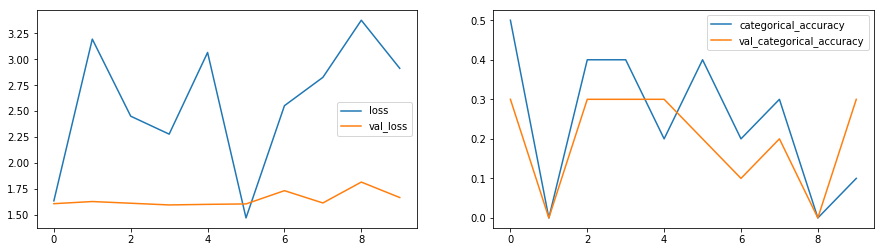

In [40]:
plotImage(history_model_1)

# Model 2 Adding dropout at convolution layers

In [41]:
class ModelConv3D2(DataGenerator):
    
    def define_model(self,filtersize=(3,3,3),dense_neurons=64,dropout=0.25):

        model = Sequential()
        model.add(Conv3D(16, filtersize, padding='same',
                 input_shape=(self.frames_to_sample,self.image_height,self.image_width,self.channels)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv3D(16, filtersize, padding='same',
                 input_shape=(self.frames_to_sample,self.image_height,self.image_width,self.channels)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling3D(pool_size=(2, 2, 2)))
        model.add(Dropout(dropout))

        model.add(Conv3D(32, filtersize, padding='same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv3D(32, filtersize, padding='same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling3D(pool_size=(2, 2, 2)))
        model.add(Dropout(dropout))

        model.add(Conv3D(64, filtersize, padding='same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv3D(64, filtersize, padding='same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling3D(pool_size=(2, 2, 2)))
        model.add(Dropout(dropout))

        model.add(Conv3D(128, filtersize, padding='same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv3D(128, filtersize, padding='same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(MaxPooling3D(pool_size=(2, 2, 2)))
        model.add(Dropout(dropout))
        
        model.add(Flatten())
        model.add(Dense(dense_neurons,activation='relu'))
        model.add(BatchNormalization())
        model.add(Dropout(dropout))

        model.add(Dense(dense_neurons,activation='relu'))
        model.add(BatchNormalization())
        model.add(Dropout(dropout))


        model.add(Dense(self.num_classes,activation='softmax'))

        optimiser = optimizers.Adam()
        model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
        return model

In [42]:
conv_3d2=ModelConv3D2()
conv_3d2.initialize_path(10,10)
conv_3d2.initialize_image_properties(image_height=120,image_width=120)
conv_3d2.initialize_hyperparams(frames_to_sample=16,batch_size=5,num_epochs=8)
conv_3d2_model=conv_3d2.define_model(filtersize=(3,3,3),dense_neurons=256,dropout=0.25)
conv_3d2_model.summary()


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv3d_40 (Conv3D)           (None, 16, 120, 120, 16)  1312      
_________________________________________________________________
activation_40 (Activation)   (None, 16, 120, 120, 16)  0         
_________________________________________________________________
batch_normalization_72 (Batc (None, 16, 120, 120, 16)  64        
_________________________________________________________________
conv3d_41 (Conv3D)           (None, 16, 120, 120, 16)  6928      
_________________________________________________________________
activation_41 (Activation)   (None, 16, 120, 120, 16)  0         
_________________________________________________________________
batch_normalization_73 (Batc (None, 16, 120, 120, 16)  64        
_________________________________________________________________
max_pooling3d_40 (MaxPooling (None, 8, 60, 60, 16)     0         
__________

In [43]:

print("Total Params:", conv_3d2_model.count_params())

history_model2=conv_3d2.train_model(conv_3d2_model,mdl_name = 'Model_3_AugData',augment_data=True)


Total Params: 2556533
# Number of training sequences =  10
# Number of validation sequences =  10
# image_height =  120
# image_width =  120
# batch size =  5
# epochs =  8
# frames_to_sample =  16


Epoch 1/8
1/2 [==============>...............] - ETA: 14s - loss: 3.0296 - categorical_accuracy: 0.2000
Epoch 00001: saving model to Model_3_AugData_2020-11-0212_46_03.787951/model-00001-2.55185-0.30000-1.60622-0.20000.h5
2/2 [==============================] - 24s 12s/step - loss: 2.5519 - categorical_accuracy: 0.3000 - val_loss: 1.6062 - val_categorical_accuracy: 0.2000
Epoch 2/8
1/2 [==============>...............] - ETA: 0s - loss: 3.2715 - categorical_accuracy: 0.0000e+00
Epoch 00002: saving model to Model_3_AugData_2020-11-0212_46_03.787951/model-00002-2.83519-0.15000-1.62395-0.20000.h5
2/2 [==============================] - 3s 1s/step - loss: 2.8352 - categorical_accuracy: 0.1500 - val_loss: 1.6240 - val_categorical_accuracy: 0.2000
Epoch 3/8
1/2 [==============>...............] - ET

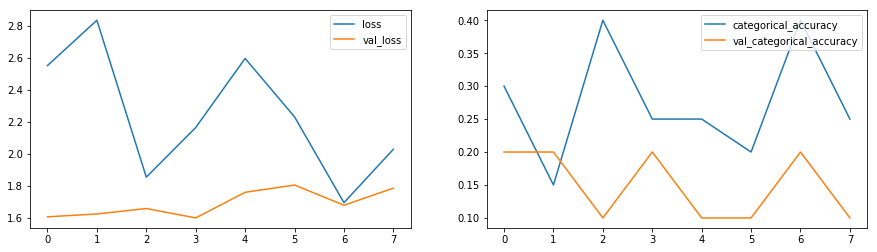

In [44]:
plotImage(history_model2)

# Model 3 - reducing the number of parameters

In [45]:
class ModelConv3D3(DataGenerator):
    
    def define_model(self,dense_neurons=64,dropout=0.25):

        model = Sequential()
        model.add(Conv3D(16, (3, 3, 3), padding='same',
                 input_shape=(self.frames_to_sample,self.image_height,self.image_width,self.channels)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling3D(pool_size=(2, 2, 2)))

        model.add(Conv3D(32, (3, 3, 3), padding='same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling3D(pool_size=(2, 2, 2)))

        model.add(Conv3D(64, (2, 2, 2), padding='same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling3D(pool_size=(2, 2, 2)))

        model.add(Conv3D(128, (2, 2, 2), padding='same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling3D(pool_size=(2, 2, 2)))
        
        model.add(Flatten())
        model.add(Dense(dense_neurons,activation='relu'))
        model.add(BatchNormalization())
        model.add(Dropout(dropout))

        model.add(Dense(dense_neurons,activation='relu'))
        model.add(BatchNormalization())
        model.add(Dropout(dropout))

        model.add(Dense(self.num_classes,activation='softmax'))

        optimiser = optimizers.Adam(lr=0.0002)
        model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
        return model

In [46]:
conv_3d3=ModelConv3D3()
conv_3d3.initialize_path(10,10)
conv_3d3.initialize_image_properties(image_height=120,image_width=120)
conv_3d3.initialize_hyperparams(frames_to_sample=16,batch_size=10,num_epochs=25)
conv_3d3_model=conv_3d3.define_model(dense_neurons=64,dropout=0.25)
conv_3d3_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv3d_48 (Conv3D)           (None, 16, 120, 120, 16)  1312      
_________________________________________________________________
activation_48 (Activation)   (None, 16, 120, 120, 16)  0         
_________________________________________________________________
batch_normalization_82 (Batc (None, 16, 120, 120, 16)  64        
_________________________________________________________________
max_pooling3d_44 (MaxPooling (None, 8, 60, 60, 16)     0         
_________________________________________________________________
conv3d_49 (Conv3D)           (None, 8, 60, 60, 32)     13856     
_________________________________________________________________
activation_49 (Activation)   (None, 8, 60, 60, 32)     0         
_________________________________________________________________
batch_normalization_83 (Batc (None, 8, 60, 60, 32)     128       
__________

In [47]:
print("Total Params:", conv_3d3_model.count_params())

history_model3=conv_3d3.train_model(conv_3d3_model,augment_data=True)

Total Params: 504709
# Number of training sequences =  10
# Number of validation sequences =  10
# image_height =  120
# image_width =  120
# batch size =  10
# epochs =  25
# frames_to_sample =  16


Epoch 1/25

Epoch 00001: saving model to Model_init_2020-11-0212_46_49.853001/model-00001-2.49060-0.10000-1.65011-0.00000.h5
1/1 [==============================] - 18s 18s/step - loss: 2.4906 - categorical_accuracy: 0.1000 - val_loss: 1.6501 - val_categorical_accuracy: 0.0000e+00
Epoch 2/25

Epoch 00002: saving model to Model_init_2020-11-0212_46_49.853001/model-00002-2.83516-0.10000-1.62411-0.00000.h5
1/1 [==============================] - 2s 2s/step - loss: 2.8352 - categorical_accuracy: 0.1000 - val_loss: 1.6241 - val_categorical_accuracy: 0.0000e+00
Epoch 3/25

Epoch 00003: saving model to Model_init_2020-11-0212_46_49.853001/model-00003-2.61709-0.15000-1.61814-0.00000.h5
1/1 [==============================] - 2s 2s/step - loss: 2.6171 - categorical_accuracy: 0.1500 - val_loss: 1.6181

# Model 4 - CNN- LSTM Model

In [48]:
class RNNCNN1(DataGenerator):
    
    def define_model(self,lstm_cells=64,dense_neurons=64,dropout=0.25):

        model = Sequential()

        model.add(TimeDistributed(Conv2D(16, (3, 3) , padding='same', activation='relu'),
                                  input_shape=(self.frames_to_sample,self.image_height,self.image_width,self.channels)))
        model.add(TimeDistributed(BatchNormalization()))
        model.add(TimeDistributed(MaxPooling2D((2, 2))))
        
        model.add(TimeDistributed(Conv2D(32, (3, 3) , padding='same', activation='relu')))
        model.add(TimeDistributed(BatchNormalization()))
        model.add(TimeDistributed(MaxPooling2D((2, 2))))
        
        model.add(TimeDistributed(Conv2D(64, (3, 3) , padding='same', activation='relu')))
        model.add(TimeDistributed(BatchNormalization()))
        model.add(TimeDistributed(MaxPooling2D((2, 2))))
        
        model.add(TimeDistributed(Conv2D(128, (3, 3) , padding='same', activation='relu')))
        model.add(TimeDistributed(BatchNormalization()))
        model.add(TimeDistributed(MaxPooling2D((2, 2))))
        
        model.add(TimeDistributed(Conv2D(256, (3, 3) , padding='same', activation='relu')))
        model.add(TimeDistributed(BatchNormalization()))
        model.add(TimeDistributed(MaxPooling2D((2, 2))))
        
        #model.add(TimeDistributed(Conv2D(512, (2, 2) , padding='valid', activation='relu')))
       # model.add(TimeDistributed(BatchNormalization()))
       # model.add(TimeDistributed(MaxPooling2D((2, 2))))

        model.add(TimeDistributed(Flatten()))


        model.add(LSTM(lstm_cells))
        model.add(Dropout(dropout))
        
        model.add(Dense(dense_neurons,activation='relu'))
        model.add(Dropout(dropout))
        
        model.add(Dense(self.num_classes, activation='softmax'))
        optimiser = optimizers.Adam()
        model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
        return model

In [49]:
rnn_cnn1 = RNNCNN1()
rnn_cnn1.initialize_path(10,10)
rnn_cnn1.initialize_image_properties(image_height=120,image_width=120)
rnn_cnn1.initialize_hyperparams(frames_to_sample=18,batch_size=5,num_epochs=5)
rnn_cnn1_model=rnn_cnn1.define_model(lstm_cells=128,dense_neurons=128,dropout=0.25)
rnn_cnn1_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_39 (TimeDis (None, 18, 120, 120, 16)  448       
_________________________________________________________________
time_distributed_40 (TimeDis (None, 18, 120, 120, 16)  64        
_________________________________________________________________
time_distributed_41 (TimeDis (None, 18, 60, 60, 16)    0         
_________________________________________________________________
time_distributed_42 (TimeDis (None, 18, 60, 60, 32)    4640      
_________________________________________________________________
time_distributed_43 (TimeDis (None, 18, 60, 60, 32)    128       
_________________________________________________________________
time_distributed_44 (TimeDis (None, 18, 30, 30, 32)    0         
_________________________________________________________________
time_distributed_45 (TimeDis (None, 18, 30, 30, 64)    18496     
__________

In [50]:
print("Total Params:", rnn_cnn1_model.count_params())

history_model4=rnn_cnn1.train_model(rnn_cnn1_model,mdl_name='Model_3dCNN_LSTM',augment_data=True)

Total Params: 1657445
# Number of training sequences =  10
# Number of validation sequences =  10
# image_height =  120
# image_width =  120
# batch size =  5
# epochs =  5
# frames_to_sample =  18


Epoch 1/5
1/2 [==============>...............] - ETA: 11s - loss: 1.6225 - categorical_accuracy: 0.1000
Epoch 00001: saving model to Model_3dCNN_LSTM_2020-11-0212_48_01.376567/model-00001-1.56699-0.20000-1.61072-0.20000.h5
2/2 [==============================] - 20s 10s/step - loss: 1.5670 - categorical_accuracy: 0.2000 - val_loss: 1.6107 - val_categorical_accuracy: 0.2000
Epoch 2/5
1/2 [==============>...............] - ETA: 0s - loss: 1.7448 - categorical_accuracy: 0.2000
Epoch 00002: saving model to Model_3dCNN_LSTM_2020-11-0212_48_01.376567/model-00002-1.75596-0.20000-1.60125-0.40000.h5
2/2 [==============================] - 2s 932ms/step - loss: 1.7560 - categorical_accuracy: 0.2000 - val_loss: 1.6012 - val_categorical_accuracy: 0.4000
Epoch 3/5
1/2 [==============>...............] - E

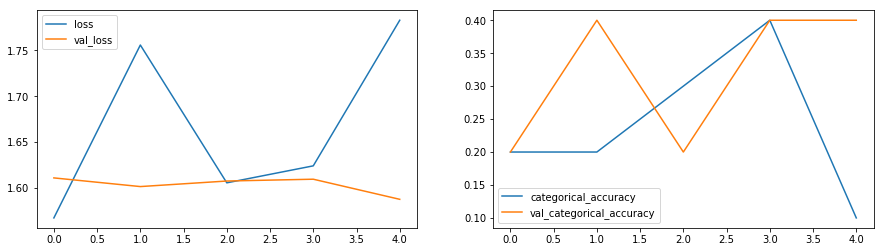

In [51]:
plotImage(history_model4)

In [53]:
lstm_cnn2d = RNNCNN1()
lstm_cnn2d.initialize_path(len(TRAIN_DOC_CSV),len(VAL_DOC_CSV))
lstm_cnn2d.initialize_image_properties(image_height=120,image_width=120)
lstm_cnn2d.initialize_hyperparams(frames_to_sample=18,batch_size=5,num_epochs=5)
lstm_cnn2d_model=lstm_cnn2d.define_model(lstm_cells=128,dense_neurons=128,dropout=0.25)
lstm_cnn2d_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_55 (TimeDis (None, 18, 120, 120, 16)  448       
_________________________________________________________________
time_distributed_56 (TimeDis (None, 18, 120, 120, 16)  64        
_________________________________________________________________
time_distributed_57 (TimeDis (None, 18, 60, 60, 16)    0         
_________________________________________________________________
time_distributed_58 (TimeDis (None, 18, 60, 60, 32)    4640      
_________________________________________________________________
time_distributed_59 (TimeDis (None, 18, 60, 60, 32)    128       
_________________________________________________________________
time_distributed_60 (TimeDis (None, 18, 30, 30, 32)    0         
_________________________________________________________________
time_distributed_61 (TimeDis (None, 18, 30, 30, 64)    18496     
__________

In [56]:
print("Total Params:", rnn_cnn1_model.count_params())

history_model4_1=lstm_cnn2d.train_model(rnn_cnn1_model,mdl_name='Model_2dCNN_LSTM',augment_data=True)

Total Params: 1657445
# Number of training sequences =  663
# Number of validation sequences =  100
# image_height =  120
# image_width =  120
# batch size =  5
# epochs =  5
# frames_to_sample =  18


Epoch 1/5
132/133 [============================>.] - ETA: 0s - loss: 1.4022 - categorical_accuracy: 0.4000
Epoch 00001: saving model to Model_2dCNN_LSTM_2020-11-0212_53_48.614295/model-00001-1.40355-0.39970-2.20828-0.21000.h5
133/133 [==============================] - 129s 970ms/step - loss: 1.4045 - categorical_accuracy: 0.3995 - val_loss: 2.2083 - val_categorical_accuracy: 0.2100
Epoch 2/5
132/133 [============================>.] - ETA: 0s - loss: 1.3172 - categorical_accuracy: 0.4417
Epoch 00002: saving model to Model_2dCNN_LSTM_2020-11-0212_53_48.614295/model-00002-1.31586-0.44268-2.37703-0.15000.h5
133/133 [==============================] - 98s 734ms/step - loss: 1.3150 - categorical_accuracy: 0.4434 - val_loss: 2.3770 - val_categorical_accuracy: 0.1500
Epoch 3/5
132/133 [==========

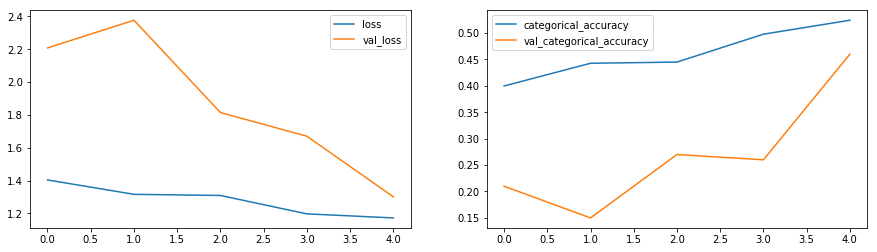

In [60]:
plotImage(history_model4_1)

In [68]:
lstm_cnn2d = RNNCNN1()
lstm_cnn2d.initialize_path(len(TRAIN_DOC_CSV),len(VAL_DOC_CSV))
lstm_cnn2d.initialize_image_properties(image_height=120,image_width=120)
lstm_cnn2d.initialize_hyperparams(frames_to_sample=18,batch_size=10,num_epochs=20)
lstm_cnn2d_model=lstm_cnn2d.define_model(lstm_cells=128,dense_neurons=128,dropout=0.25)
lstm_cnn2d_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_110 (TimeDi (None, 18, 120, 120, 16)  448       
_________________________________________________________________
time_distributed_111 (TimeDi (None, 18, 120, 120, 16)  64        
_________________________________________________________________
time_distributed_112 (TimeDi (None, 18, 60, 60, 16)    0         
_________________________________________________________________
time_distributed_113 (TimeDi (None, 18, 60, 60, 32)    4640      
_________________________________________________________________
time_distributed_114 (TimeDi (None, 18, 60, 60, 32)    128       
_________________________________________________________________
time_distributed_115 (TimeDi (None, 18, 30, 30, 32)    0         
_________________________________________________________________
time_distributed_116 (TimeDi (None, 18, 30, 30, 64)    18496     
__________

In [69]:
print("Total Params:", rnn_cnn1_model.count_params())

history_model4_1=lstm_cnn2d.train_model(rnn_cnn1_model,mdl_name='Model_2dCNN_LSTM',augment_data=True)

Total Params: 1657445
# Number of training sequences =  663
# Number of validation sequences =  100
# image_height =  120
# image_width =  120
# batch size =  10
# epochs =  20
# frames_to_sample =  18


Epoch 1/20
66/67 [============================>.] - ETA: 1s - loss: 0.9688 - categorical_accuracy: 0.6144
Epoch 00001: saving model to Model_2dCNN_LSTM_2020-11-0213_09_31.614538/model-00001-0.96674-0.61538-1.07413-0.52000.h5
67/67 [==============================] - 104s 2s/step - loss: 0.9620 - categorical_accuracy: 0.6176 - val_loss: 1.0741 - val_categorical_accuracy: 0.5200
Epoch 2/20
66/67 [============================>.] - ETA: 1s - loss: 0.8293 - categorical_accuracy: 0.6614
Epoch 00002: saving model to Model_2dCNN_LSTM_2020-11-0213_09_31.614538/model-00002-0.82938-0.66063-1.37311-0.47000.h5
67/67 [==============================] - 95s 1s/step - loss: 0.8296 - categorical_accuracy: 0.6590 - val_loss: 1.3731 - val_categorical_accuracy: 0.4700
Epoch 3/20
66/67 [=====================

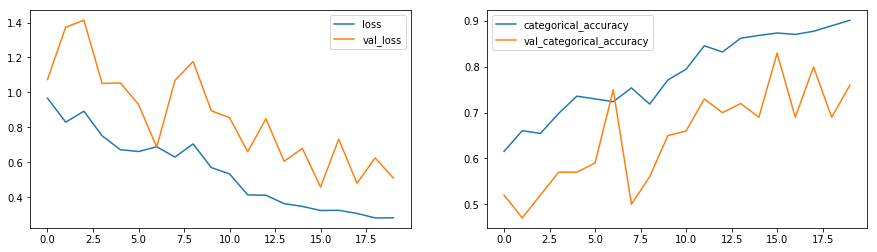

In [70]:
plotImage(history_model4_1)

# Model 5 - CNN LSTM with GRU

In [71]:
class RNNCNN2(DataGenerator):
    
    def define_model(self,lstm_cells=64,dense_neurons=64,dropout=0.25):

        model = Sequential()

        model.add(TimeDistributed(Conv2D(16, (3, 3) , padding='same', activation='relu'),
                                  input_shape=(self.frames_to_sample,self.image_height,self.image_width,self.channels)))
        model.add(TimeDistributed(BatchNormalization()))
        model.add(TimeDistributed(MaxPooling2D((2, 2))))
        
        model.add(TimeDistributed(Conv2D(32, (3, 3) , padding='same', activation='relu')))
        model.add(TimeDistributed(BatchNormalization()))
        model.add(TimeDistributed(MaxPooling2D((2, 2))))
        
        model.add(TimeDistributed(Conv2D(64, (3, 3) , padding='same', activation='relu')))
        model.add(TimeDistributed(BatchNormalization()))
        model.add(TimeDistributed(MaxPooling2D((2, 2))))
        
        model.add(TimeDistributed(Conv2D(128, (3, 3) , padding='same', activation='relu')))
        model.add(TimeDistributed(BatchNormalization()))
        model.add(TimeDistributed(MaxPooling2D((2, 2))))
        

        model.add(TimeDistributed(Flatten()))


        model.add(GRU(lstm_cells))
        model.add(Dropout(dropout))
        
        model.add(Dense(dense_neurons,activation='relu'))
        model.add(Dropout(dropout))
        
        model.add(Dense(self.num_classes, activation='softmax'))
        optimiser = optimizers.Adam(lr=0.0002)
        model.compile(optimizer=optimiser, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
        return model

In [72]:
gru_cnn2=RNNCNN2()
gru_cnn2.initialize_path(10,10)
gru_cnn2.initialize_image_properties(image_height=120,image_width=120)
gru_cnn2.initialize_hyperparams(frames_to_sample=18,batch_size=10,num_epochs=5)
gru_cnn2=gru_cnn2.define_model(lstm_cells=128,dense_neurons=128,dropout=0.25)
gru_cnn2.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_126 (TimeDi (None, 18, 120, 120, 16)  448       
_________________________________________________________________
time_distributed_127 (TimeDi (None, 18, 120, 120, 16)  64        
_________________________________________________________________
time_distributed_128 (TimeDi (None, 18, 60, 60, 16)    0         
_________________________________________________________________
time_distributed_129 (TimeDi (None, 18, 60, 60, 32)    4640      
_________________________________________________________________
time_distributed_130 (TimeDi (None, 18, 60, 60, 32)    128       
_________________________________________________________________
time_distributed_131 (TimeDi (None, 18, 30, 30, 32)    0         
_________________________________________________________________
time_distributed_132 (TimeDi (None, 18, 30, 30, 64)    18496     
__________

In [73]:
print("Total Params:", gru_cnn2_model.count_params())

history_model5=gru_cnn2.train_model(gru_cnn2_model,mdl_name = 'Model_2dCNN_GRU', augment_data=True)

Total Params: 2573541


AttributeError: 'Sequential' object has no attribute 'train_model'

In [ ]:
plotImage(history_model5)

In [58]:
gru_cnn2=CNN2GRU()
gru_cnn2.initialize_path(len(TRAIN_DOC_CSV),len(VAL_DOC_CSV))
gru_cnn2.initialize_image_properties(image_height=120,image_width=120)
gru_cnn2.initialize_hyperparams(frames_to_sample=18,batch_size=10,num_epochs=20)
gru_cnn2_model=gru_cnn2.define_model(gru_cells=128,dense_neurons=128,dropout=0.25)
gru_cnn2_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_71 (TimeDis (None, 18, 120, 120, 16)  448       
_________________________________________________________________
time_distributed_72 (TimeDis (None, 18, 120, 120, 16)  64        
_________________________________________________________________
time_distributed_73 (TimeDis (None, 18, 60, 60, 16)    0         
_________________________________________________________________
time_distributed_74 (TimeDis (None, 18, 60, 60, 32)    4640      
_________________________________________________________________
time_distributed_75 (TimeDis (None, 18, 60, 60, 32)    128       
_________________________________________________________________
time_distributed_76 (TimeDis (None, 18, 30, 30, 32)    0         
_________________________________________________________________
time_distributed_77 (TimeDis (None, 18, 30, 30, 64)    18496     
__________

In [59]:
print("Total Params:", gru_cnn2_model.count_params())

history_mode5_1=gru_cnn2_model.train_model(gru_cnn2_model,mdl_name = 'Model_2dCNN_GRU', augment_data=True)

Total Params: 2573541


AttributeError: 'Sequential' object has no attribute 'train_model'

In [ ]:
plotImage(history_model5_1)